In [99]:
import os, pathlib
# ---- Standard imports ----
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random
from pathlib import Path
from tqdm import tqdm
import pandas as pd
import h5py
from scipy.ndimage import gaussian_filter, map_coordinates
import json
import shutil

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# ---- Reproducibility ----
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

# ---- Device (cuda > mps > cpu) ----
if torch.cuda.is_available():
    device = torch.device('cuda')
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print(f"Using device: {device}")

Using device: mps


In [100]:
vangogh_path = str("/Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh")


In [101]:
# Verify vangogh_path is populated
print(f"vangogh_path  = {vangogh_path}")
print(f"Exists: {os.path.exists(vangogh_path)}")
if os.path.exists(vangogh_path):
    print(f"Items: {os.listdir(vangogh_path)[:10]}")

vangogh_path  = /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh
Exists: True
Items: ['Paris', 'Watercolors', '.DS_Store', 'Saint Remy', 'Face', 'Drawings', 'Villege', 'Sketches in letters', 'Arles', 'Auvers sur Oise']


In [102]:
processed_path = str("/Users/althafali/Downloads/ARTIFEX/implementation/data/processed")

print(f"vangogh_path   = {vangogh_path}")
print(f"processed_path = {processed_path}")

vangogh_path   = /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh
processed_path = /Users/althafali/Downloads/ARTIFEX/implementation/data/processed


In [103]:
print({vangogh_path})

{'/Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh'}


In [104]:
#Exploring dataset structure
for item in os.listdir(vangogh_path):
    item_path = os.path.join(vangogh_path, item)
    if os.path.isdir(item_path):
        print(f"{item}/ (folder)")
    else:
        print(f"{item}")


csv_files = [f for f in os.listdir(vangogh_path) if f.endswith(".csv")]

if csv_files:
    csv_path = os.path.join(vangogh_path, csv_files[0])
    print(f"\nFound CSV: {csv_files[0]}")

    df = pd.read_csv(csv_path)
    print(f"\nCSV contains {len(df)} entries")
    print(f"Columns: {list(df.columns)}")
else:
    print("\nNo CSV file found")
    df = None

Paris/ (folder)
Watercolors/ (folder)
.DS_Store
Saint Remy/ (folder)
Face/ (folder)
Drawings/ (folder)
Villege/ (folder)
Sketches in letters/ (folder)
Arles/ (folder)
Auvers sur Oise/ (folder)
Nuenen/ (folder)
VanGoghPaintings.csv
Works of the young van Gogh/ (folder)

Found CSV: VanGoghPaintings.csv

CSV contains 2025 entries
Columns: ['image_path', 'class_name', 'labels']


In [105]:
data_root = "/Users/althafali/Desktop/fads/data/VanGoghPaintingsData"

csv_files = [f for f in os.listdir(data_root) if f.endswith(".csv")]

if csv_files:
    csv_path = os.path.join(data_root, csv_files[0])
    print(f"\nFound CSV: {csv_files[0]}")

    df = pd.read_csv(csv_path)
    print(f"\nCSV contains {len(df)} entries")
    print(f"Columns: {list(df.columns)}")
else:
    print("\nNo CSV file found")
    df = None


Found CSV: VanGoghPaintings.csv

CSV contains 2025 entries
Columns: ['image_path', 'class_name', 'labels']


In [106]:
print(df.head())

                                          image_path class_name  labels
0  /kaggle/input/van-gogh-paintings/Paris/Vase wi...      Paris       6
1  /kaggle/input/van-gogh-paintings/Paris/Self-Po...      Paris       6
2  /kaggle/input/van-gogh-paintings/Paris/Vase wi...      Paris       6
3  /kaggle/input/van-gogh-paintings/Paris/Still L...      Paris       6
4  /kaggle/input/van-gogh-paintings/Paris/Windmil...      Paris       6


In [107]:
def find_all_images(root_path):
    image_extensions = ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']
    image_files = []

    for root, dirs, files in os.walk(root_path):
        for file in files:
            if any(file.lower().endswith(ext.lower()) for ext in image_extensions):
                full_path = os.path.join(root, file)
                image_files.append(full_path)
    return image_files

# Find all images
all_image_paths = find_all_images(vangogh_path)
print(f" Total images found: {len(all_image_paths)}")

 Total images found: 2025


In [108]:
# Show paths
for path in all_image_paths[:5]:
    print(f" {path}")

 /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh/Paris/Vase with Carnations and Roses and a Bottle.jpg
 /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh/Paris/Still Life with Basket of Apples.jpg
 /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh/Paris/Vase with Cornflowers and Poppies.jpg
 /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh/Paris/View of the Roofs of Paris.jpg
 /Users/althafali/Downloads/ARTIFEX/implementation/datasets/VanGoghPaintingsData/VincentVanGogh/Paris/Still Life with Apples, Meat and a Roll.jpg


In [109]:
# Verify images can be loaded
print("\n Checking first 5 images...")
for i, img_path in enumerate(all_image_paths[:5]):
    try:
        img = Image.open(img_path)
        print(f" {os.path.basename(img_path)}: {img.size} - Mode: {img.mode}")
    except Exception as e:
        print(f" Error loading {os.path.basename(img_path)}: {e}")



 Checking first 5 images...
 Vase with Carnations and Roses and a Bottle.jpg: (1770, 2281) - Mode: RGB
 Still Life with Basket of Apples.jpg: (2716, 2304) - Mode: RGB
 Vase with Cornflowers and Poppies.jpg: (720, 1024) - Mode: RGB
 View of the Roofs of Paris.jpg: (2530, 1748) - Mode: RGB
 Still Life with Apples, Meat and a Roll.jpg: (2722, 2257) - Mode: RGB


In [110]:
# Analyze all images
valid_images = []
sizes = []
modes = []

for img_path in tqdm(all_image_paths):
    try:
        img = Image.open(img_path)
        valid_images.append(img_path)
        sizes.append(img.size)
        modes.append(img.mode)
    except Exception as e:
        print(f" Skipping corrupted image: {os.path.basename(img_path)}")

print(f"\n Valid images: {len(valid_images)}/{len(all_image_paths)}")

  0%|          | 0/2025 [00:00<?, ?it/s]

100%|██████████| 2025/2025 [00:00<00:00, 4465.20it/s]


 Valid images: 2025/2025


In [111]:
# Size statistics
widths = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

print(f"\n Image size statistics:")
print(f"   Width range: {min(widths)} to {max(widths)} pixels")
print(f"   Height range: {min(heights)} to {max(heights)} pixels")
print(f"   Average size: {int(np.mean(widths))}×{int(np.mean(heights))}")


 Image size statistics:
   Width range: 274 to 3085 pixels
   Height range: 384 to 3573 pixels
   Average size: 1315×1329


In [112]:
# Mode statistics
mode_counts = pd.Series(modes).value_counts()
print(f"\n Color modes:")
for mode, count in mode_counts.items():
    print(f"   {mode}: {count} images")


 Color modes:
   RGB: 2025 images


In [113]:
# Update image list to only valid images
all_image_paths = valid_images
print(f"\n Using {len(all_image_paths)} valid images")


 Using 2025 valid images


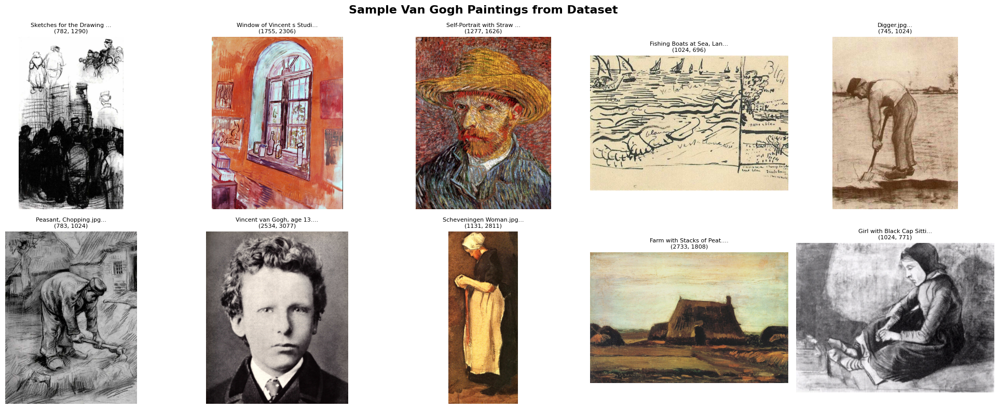

In [114]:
# Display 10 random Van Gogh paintings
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle('Sample Van Gogh Paintings from Dataset', fontsize=16, fontweight='bold')

sample_paths = random.sample(all_image_paths, min(10, len(all_image_paths)))

for idx, (ax, img_path) in enumerate(zip(axes.flatten(), sample_paths)):
    try:
        img = Image.open(img_path).convert('RGB')
        ax.imshow(img)
        filename = os.path.basename(img_path)
        ax.set_title(f"{filename[:25]}...\n{img.size}", fontsize=8)
        ax.axis('off')
    except Exception as e:
        ax.text(0.5, 0.5, f'Error loading\n{filename}',
                ha='center', va='center', fontsize=8)
        ax.axis('off')
plt.tight_layout()
plt.show()

In [115]:
# Define all necessary output folders
folders = [
    os.path.join(processed_path, "train/original"),
    os.path.join(processed_path, "train/masked"),
    os.path.join(processed_path, "train/masks"),
    os.path.join(processed_path, "val/original"),
    os.path.join(processed_path, "val/masked"),
    os.path.join(processed_path, "val/masks"),
    os.path.join(processed_path, "test/original"),
    os.path.join(processed_path, "test/masked"),
    os.path.join(processed_path, "test/masks"),
    str("/Users/althafali/Downloads/ARTIFEX/implementation/models/saved_models"),
    str("/Users/althafali/Downloads/ARTIFEX/implementation/results/training_logs"),
    str("/Users/althafali/Downloads/ARTIFEX/implementation/results/outputs"),
]

# Create all folders if they don't exist
for folder in folders:
    os.makedirs(folder, exist_ok=True)

print("Folder structure:")
for folder in folders:
    print(f"  {folder}")

Folder structure:
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/original
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masked
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/original
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/masked
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/masks
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/original
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masked
  /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masks
  /Users/althafali/Downloads/ARTIFEX/implementation/models/saved_models
  /Users/althafali/Downloads/ARTIFEX/implementation/results/training_logs
  /Users/althafali/Downloads/ARTIFEX/implementation/results/outputs


In [116]:
from PIL import Image

def preprocess_image(input_path, output_path, target_size=(512, 512)):
    try:
        img = Image.open(input_path).convert('RGB')
        img = img.resize(target_size, Image.LANCZOS)
        img.save(output_path, 'PNG')
        return True
    except Exception as e:
        print(f"Error processing {input_path}: {e}")
        return False

# Shuffle and split images (70% train, 15% val, 15% test)
random.shuffle(all_image_paths)
total_images = len(all_image_paths)

train_split = 0.7
val_split = 0.15

train_end = int(total_images * train_split)
val_end = train_end + int(total_images * val_split)

train_paths = all_image_paths[:train_end]
val_paths = all_image_paths[train_end:val_end]
test_paths = all_image_paths[val_end:]

print(f"Training images: {len(train_paths)}")
print(f"Validation images: {len(val_paths)}")
print(f"Testing images: {len(test_paths)}")

# Process images function to avoid repetition
def process_images(image_paths, save_dir, prefix):
    success_count = 0
    for idx, img_path in enumerate(tqdm(image_paths)):
        output_path = os.path.join(save_dir, f"{prefix}_{idx:04d}.png")
        if preprocess_image(img_path, output_path):
            success_count += 1
    print(f"Processed {success_count}/{len(image_paths)} images in {save_dir}")

Training images: 1417
Validation images: 303
Testing images: 305


100%|██████████| 1417/1417 [00:59<00:00, 23.71it/s]


Processed 1417/1417 images in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/original


100%|██████████| 303/303 [00:14<00:00, 21.57it/s]


Processed 303/303 images in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/original


100%|██████████| 305/305 [00:13<00:00, 22.18it/s]

Processed 305/305 images in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/original
vangogh_train_0171.png: size=(512, 512), dtype=float64, min=0.020, max=1.000


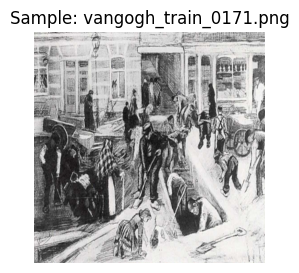

vangogh_train_0617.png: size=(512, 512), dtype=float64, min=0.000, max=1.000


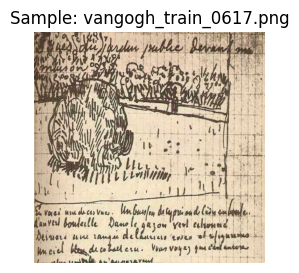

vangogh_train_0603.png: size=(512, 512), dtype=float64, min=0.000, max=1.000


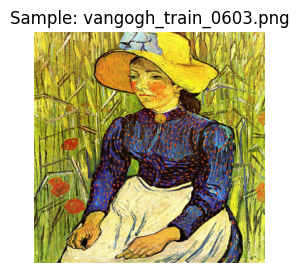

vangogh_train_0165.png: size=(512, 512), dtype=float64, min=0.000, max=1.000


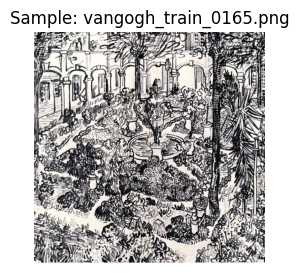

vangogh_train_1253.png: size=(512, 512), dtype=float64, min=0.000, max=1.000


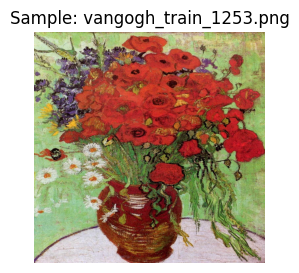

In [117]:
# Make sure directories exist
os.makedirs(os.path.join(processed_path, 'train/original'), exist_ok=True)
os.makedirs(os.path.join(processed_path, 'val/original'), exist_ok=True)
os.makedirs(os.path.join(processed_path, 'test/original'), exist_ok=True)

# Process datasets
process_images(train_paths, os.path.join(processed_path, 'train/original'), 'vangogh_train')
process_images(val_paths, os.path.join(processed_path, 'val/original'), 'vangogh_val')
process_images(test_paths, os.path.join(processed_path, 'test/original'), 'vangogh_test')

# Verification: Load and check a few sample images from train set
sample_files = os.listdir(os.path.join(processed_path, 'train/original'))[:5]
train_original_path = os.path.join(processed_path, 'train/original')

for f in sample_files:
    img_path = os.path.join(train_original_path, f)
    img = Image.open(img_path)
    img_array = np.array(img) / 255.0  # Normalize to 0-1 for checking

    print(f"{f}: size={img.size}, dtype={img_array.dtype}, min={img_array.min():.3f}, max={img_array.max():.3f}")

    plt.figure(figsize=(3,3))
    plt.imshow(img_array)
    plt.title(f"Sample: {f}")
    plt.axis('off')
    plt.show()

In [81]:
# Check all images in train, val, test splits
for split, files in zip(['train', 'val', 'test'], [train_paths, val_paths, test_paths]):
    dir_path = os.path.join(processed_path, f"{split}/original")
    saved_files = os.listdir(dir_path)
    assert len(saved_files) == len(files), f"{split} mismatch: processed {len(saved_files)} vs. expected {len(files)}"
    for f in saved_files:
        img = Image.open(os.path.join(dir_path, f))
        assert img.size == (512, 512), f"{f} size error: {img.size}"
print("All Input 1 processed images verified for shape, count, and format.")


All Input 1 processed images verified for shape, count, and format.


In [118]:
import os
import random
import shutil

# Paths 
original_mask_folder = "/Users/althafali/Downloads/ARTIFEX/implementation/datasets/mask"
train_mask_folder = "/Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks"
val_mask_folder   = "/Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/masks"
test_mask_folder  = "/Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masks"

# Create output folders if needed
os.makedirs(train_mask_folder, exist_ok=True)
os.makedirs(val_mask_folder, exist_ok=True)
os.makedirs(test_mask_folder, exist_ok=True)

# List all original mask filenames
all_masks = [f for f in os.listdir(original_mask_folder) if f.endswith('.png')]
print(f"Total original masks found: {len(all_masks)}")

# Set random seed for reproducibility
random.seed(42)
random.shuffle(all_masks)

# Split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

train_end = int(len(all_masks) * train_ratio)
val_end   = train_end + int(len(all_masks) * val_ratio)

train_masks = all_masks[:train_end]
val_masks   = all_masks[train_end:val_end]
test_masks  = all_masks[val_end:]

print(f"Train masks: {len(train_masks)}")
print(f"Validation masks: {len(val_masks)}")
print(f"Test masks: {len(test_masks)}")

# Copy files to respective folders
for f in train_masks:
    shutil.copy(os.path.join(original_mask_folder, f), os.path.join(train_mask_folder, f))

for f in val_masks:
    shutil.copy(os.path.join(original_mask_folder, f), os.path.join(val_mask_folder, f))

for f in test_masks:
    shutil.copy(os.path.join(original_mask_folder, f), os.path.join(test_mask_folder, f))

print("Mask splitting completed. Train/validation/test subsets ready for augmentation or further processing.")

Total original masks found: 49
Train masks: 34
Validation masks: 7
Test masks: 8
Mask splitting completed. Train/validation/test subsets ready for augmentation or further processing.


In [119]:
import numpy as np
from PIL import Image
import cv2
from scipy.ndimage import morphology, gaussian_filter, map_coordinates
from tqdm import tqdm

def load_mask(path, size=(512,512)):
    mask = Image.open(path).convert('L')
    mask = mask.resize(size, Image.NEAREST)
    mask = np.array(mask)
    mask = (mask > 128).astype(np.uint8) * 255
    return mask

def save_mask(mask, path):
    im = Image.fromarray(mask.astype(np.uint8))
    im.save(path)

def horizontal_flip(img): return np.fliplr(img)
def vertical_flip(img): return np.flipud(img)
def rotate(img, angle):
    h, w = img.shape
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST)
def scale(img, factor):
    h, w = img.shape
    new_size = (int(w*factor), int(h*factor))
    scaled = cv2.resize(img, new_size, interpolation=cv2.INTER_NEAREST)
    if factor < 1.0:
        pad_w, pad_h = (w - new_size[0]) // 2, (h - new_size[1]) // 2
        padded = np.zeros((h, w), dtype=np.uint8)
        padded[pad_h:pad_h+new_size[1], pad_w:pad_w+new_size[0]] = scaled
        return padded
    else:
        start_x, start_y = (new_size[0] - w) // 2, (new_size[1] - h) // 2
        return scaled[start_y:start_y+h, start_x:start_x+w]
def elastic_deformation(image, alpha, sigma):
    random_state = np.random.RandomState(None)
    shape = image.shape
    dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha
    dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha
    x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
    indices = (y + dy).reshape(-1), (x + dx).reshape(-1)
    distorted = map_coordinates(image, indices, order=1, mode='reflect').reshape(shape)
    return (distorted > 128).astype(np.uint8) * 255

def adjust_mask_coverage(mask, target_coverage, tol=0.02, max_iter=50):
    h, w = mask.shape
    total = h * w
    adjusted = mask.copy()
    for _ in range(max_iter):
        current = np.sum(adjusted > 0) / total
        if abs(current - target_coverage) < tol: break
        if current > target_coverage:
            adjusted = morphology.binary_erosion(adjusted, structure=np.ones((3,3))).astype(np.uint8) * 255
        else:
            adjusted = morphology.binary_dilation(adjusted, structure=np.ones((3,3))).astype(np.uint8) * 255
    return adjusted

def augment_mask(mask):
    aug = [mask, horizontal_flip(mask), vertical_flip(mask)]
    for a in [90, 180, 270]: aug.append(rotate(mask, a))
    for s in [0.8, 1.2]: aug.append(scale(mask, s))
    aug.append(elastic_deformation(mask, alpha=8, sigma=4))
    return aug

def coverage_stats(mask):
    coverage = np.sum(np.array(mask)>0) / (mask.shape[0]*mask.shape[1])
    return coverage


In [120]:
def augment_and_adjust(input_folder, output_folder):
    masks = [f for f in os.listdir(input_folder) if f.endswith('.png')]
    os.makedirs(output_folder, exist_ok=True)
    idx = 0
    for mask_file in tqdm(masks, desc=f"Augmenting {input_folder}"):
        mask_path = os.path.join(input_folder, mask_file)
        mask = load_mask(mask_path)
        for aug_idx, aug_mask in enumerate(augment_mask(mask)):
            # FIX: Use lower coverage targets for crack masks to avoid dilating them into fat blobs
            for cov_target in [0.15, 0.30, 0.45]:
                adj_mask = adjust_mask_coverage(aug_mask, cov_target, tol=0.02)
                cov = coverage_stats(adj_mask)
                if abs(cov-cov_target) > 0.03:
                    print(f"Warning: {mask_file} (aug{aug_idx}, cov{int(cov_target*100)}) coverage={cov:.2f}, target={cov_target}")
                out_name = f"{os.path.splitext(mask_file)[0]}_aug{aug_idx}_cov{int(cov_target*100)}.png"
                save_mask(adj_mask, os.path.join(output_folder, out_name))
                idx += 1
    print(f"Generated {idx} augmented masks in {output_folder}")


In [121]:
augment_and_adjust(train_mask_folder, os.path.join(processed_path, 'train/augmented_masks'))
augment_and_adjust(val_mask_folder,   os.path.join(processed_path, 'val/augmented_masks'))
augment_and_adjust(test_mask_folder,  os.path.join(processed_path, 'test/augmented_masks'))

print("All damage masks split, augmented, coverage-adjusted, and verified.")


Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:   0%|          | 0/34 [00:00<?, ?it/s]/var/folders/g0/ysrq7gdd33jg2mqrs252qcdw0000gn/T/ipykernel_74171/1890704402.py:57: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  adjusted = morphology.binary_dilation(adjusted, structure=np.ones((3,3))).astype(np.uint8) * 255
Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:   3%|▎         | 1/34 [00:00<00:22,  1.49it/s]/var/folders/g0/ysrq7gdd33jg2mqrs252qcdw0000gn/T/ipykernel_74171/1890704402.py:55: DeprecationWarning: Please import `binary_erosion` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  adjusted = morphology.binary_erosion(adjusted, structure=np.ones((3,3))).astype(np.uint8) * 255
Augmenting /Users/

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  44%|████▍     | 15/34 [00:10<00:24,  1.27s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  47%|████▋     | 16/34 [00:13<00:29,  1.64s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  59%|█████▉    | 20/34 [00:15<00:10,  1.27it/s]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  62%|██████▏   | 21/34 [00:17<00:13,  1.06s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  65%|██████▍   | 22/34 [00:20<00:18,  1.52s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  68%|██████▊   | 23/34 [00:21<00:14,  1.35s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  71%|███████   | 24/34 [00:22<00:12,  1.27s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  85%|████████▌ | 29/34 [00:27<00:05,  1.19s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  88%|████████▊ | 30/34 [00:27<00:04,  1.00s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  91%|█████████ | 31/34 [00:28<00:02,  1.00it/s]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  94%|█████████▍| 32/34 [00:29<00:01,  1.08it/s]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks:  97%|█████████▋| 33/34 [00:31<00:01,  1.13s/it]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/masks: 100%|██████████| 34/34 [00:31<00:00,  1.08it/s]


Generated 918 augmented masks in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/augmented_masks


Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/masks: 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


Generated 189 augmented masks in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/augmented_masks


Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masks:  50%|█████     | 4/8 [00:02<00:02,  1.67it/s]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masks:  62%|██████▎   | 5/8 [00:03<00:02,  1.41it/s]

Augmenting /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/masks: 100%|██████████| 8/8 [00:04<00:00,  1.71it/s]

Generated 216 augmented masks in /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/augmented_masks
All damage masks split, augmented, coverage-adjusted, and verified.


In [86]:
# # ============================================================================
# # PHASE 1.2: GENERATE "HOLES" MASKS FOR 30/45% COVERAGE
# # ============================================================================
# # These are separate from crack masks - use for high-coverage damage scenarios

# import random

# def generate_hole_mask(size=(512, 512), target_coverage=0.30, tol=0.02):
#     """
#     Generate a mask with large missing regions (holes/blobs/rectangles).
#     NOT based on crack patterns - these are big missing chunks.
    
#     Args:
#         size: (H, W) tuple
#         target_coverage: fraction of image to mask (0.30 or 0.45)
#         tol: tolerance for coverage matching
    
#     Returns:
#         Binary mask (H, W) with values {0, 255}
#     """
#     H, W = size
#     mask = np.zeros((H, W), dtype=np.uint8)
#     total_pixels = H * W
#     current_coverage = 0.0
    
#     max_attempts = 100
#     attempts = 0
    
#     while current_coverage < target_coverage and attempts < max_attempts:
#         attempts += 1
        
#         # Randomly choose shape type
#         shape_type = random.choice(['rectangle', 'ellipse', 'blob'])
        
#         if shape_type == 'rectangle':
#             # Random rectangle
#             rect_h = random.randint(50, 200)
#             rect_w = random.randint(50, 200)
#             top = random.randint(0, H - rect_h)
#             left = random.randint(0, W - rect_w)
#             mask[top:top+rect_h, left:left+rect_w] = 255
            
#         elif shape_type == 'ellipse':
#             # Random ellipse
#             center_x = random.randint(50, W - 50)
#             center_y = random.randint(50, H - 50)
#             axes_x = random.randint(30, 100)
#             axes_y = random.randint(30, 100)
#             cv2.ellipse(mask, (center_x, center_y), (axes_x, axes_y), 
#                        random.randint(0, 180), 0, 360, 255, -1)
            
#         else:  # blob
#             # Irregular blob using random polygon
#             num_points = random.randint(5, 10)
#             center_x = random.randint(100, W - 100)
#             center_y = random.randint(100, H - 100)
#             radius = random.randint(40, 120)
            
#             angles = sorted([random.uniform(0, 2*np.pi) for _ in range(num_points)])
#             points = []
#             for angle in angles:
#                 r = radius * random.uniform(0.5, 1.5)
#                 x = int(center_x + r * np.cos(angle))
#                 y = int(center_y + r * np.sin(angle))
#                 x = max(0, min(W-1, x))
#                 y = max(0, min(H-1, y))
#                 points.append([x, y])
            
#             points = np.array(points, dtype=np.int32)
#             cv2.fillPoly(mask, [points], 255)
        
#         current_coverage = np.sum(mask > 0) / total_pixels
        
#         # If we overshot, try to erode a bit
#         if current_coverage > target_coverage + tol:
#             kernel = np.ones((5, 5), np.uint8)
#             mask = cv2.erode(mask, kernel, iterations=1)
#             current_coverage = np.sum(mask > 0) / total_pixels
    
#     return mask


# def generate_holes_masks(output_folder, num_masks=100, coverage_targets=[0.30, 0.45]):
#     """
#     Generate a set of holes masks for high-coverage damage scenarios.
    
#     Args:
#         output_folder: where to save the masks
#         num_masks: how many masks per coverage level
#         coverage_targets: list of target coverages
#     """
#     os.makedirs(output_folder, exist_ok=True)
    
#     for cov_target in coverage_targets:
#         for i in tqdm(range(num_masks), desc=f"Generating {int(cov_target*100)}% holes"):
#             mask = generate_hole_mask(target_coverage=cov_target)
            
#             # Random augmentation
#             if random.random() > 0.5:
#                 mask = np.fliplr(mask)
#             if random.random() > 0.5:
#                 mask = np.flipud(mask)
#             if random.random() > 0.5:
#                 angle = random.choice([90, 180, 270])
#                 if angle == 90:
#                     mask = np.rot90(mask)
#                 elif angle == 180:
#                     mask = np.rot90(mask, 2)
#                 else:
#                     mask = np.rot90(mask, 3)
            
#             mask = (mask > 128).astype(np.uint8) * 255  # Ensure binary
            
#             actual_cov = np.sum(mask > 0) / (512 * 512)
#             out_name = f"holes_{i:04d}_cov{int(cov_target*100)}.png"
#             save_mask(mask, os.path.join(output_folder, out_name))
    
#     print(f"Generated {num_masks * len(coverage_targets)} holes masks in {output_folder}")


# # Generate holes masks for each split
# print("="*60)
# print("GENERATING HOLES MASKS FOR HIGH-COVERAGE DAMAGE")
# print("="*60)

# for split in ['train', 'val', 'test']:
#     holes_dir = os.path.join(processed_path, f'{split}/augmented_holes')
#     num_masks = {'train': 100, 'val': 30, 'test': 30}[split]
#     generate_holes_masks(holes_dir, num_masks=num_masks, coverage_targets=[0.30, 0.45])

# print("\n✓ Holes masks generated successfully!")

In [122]:
import os
import numpy as np
import cv2
import h5py
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from scipy.ndimage import gaussian_filter


NUM_BINS = 8  # 8 bins × 22.5° = [0,180) coverage


# ============================================================================
# CORE FEATURE EXTRACTORS
# ============================================================================

def compute_orientation_and_coherence(image_gray, sigma=3.0, flow_offset_deg=90.0):
    """
    Structure tensor orientation + coherence.

    Args:
        image_gray      : (H, W) float32/float64 in [0, 1]
        sigma           : Gaussian smoothing for structure tensor components
        flow_offset_deg : add 90° to rotate gradient-normal orientation into
                          stroke FLOW direction (along strokes). Set to 0.0
                          if your overlay shows arrows already aligned.

    Returns:
        orientation : (H, W) float32, strictly in [0, 180)
        coherence   : (H, W) float32, in [0, 1]
    """
    # Gradients (float64 for stability)
    Ix = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=3)

    # Structure tensor components (smoothed outer products)
    Ixx = gaussian_filter(Ix * Ix, sigma)
    Ixy = gaussian_filter(Ix * Iy, sigma)
    Iyy = gaussian_filter(Iy * Iy, sigma)

    # Orientation (float64), no rounding
    # This formula gives a dominant local direction up to a 180° ambiguity.
    theta_rad = 0.5 * np.arctan2(2.0 * Ixy, (Ixx - Iyy))
    theta_deg = np.degrees(theta_rad)

    # Convert to stroke FLOW direction if needed (+90°), then wrap to [0,180)
    theta_deg = (theta_deg + float(flow_offset_deg)) % 180.0  # float64, [0,180)

    # Coherence (how “line-like” the local structure is)
    diff = Ixx - Iyy
    numerator = np.sqrt(diff * diff + 4.0 * Ixy * Ixy)
    denominator = Ixx + Iyy + 1e-8
    coherence = np.clip(numerator / denominator, 0.0, 1.0)

    return theta_deg.astype(np.float32), coherence.astype(np.float32)


def compute_edge_strength_map(image_gray):
    """
    Sobel magnitude, normalized per image via 99th percentile to [0,1].

    Args:
        image_gray : (H, W) float32/float64 in [0, 1]

    Returns:
        edge : (H, W) float32 in [0, 1]
    """
    sx = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(sx * sx + sy * sy)

    p99 = np.percentile(mag, 99)
    mag = np.clip(mag / (p99 + 1e-8), 0.0, 1.0)
    return mag.astype(np.float32)


def compute_spatial_angular_histograms(orientation_map, coherence_map, grid_size,
                                      coherence_thresh=0.05):
    """
    Coherence-weighted orientation histograms over a grid_size×grid_size partition.

    Args:
        orientation_map  : (H, W) float32, strictly in [0, 180)
        coherence_map    : (H, W) float32 in [0, 1]
        grid_size        : 4 → (16, 8) or 8 → (64, 8)
        coherence_thresh : ignore pixels with coherence below this (too noisy)

    Returns:
        histograms : (grid_size*grid_size, 8) float32, each row sums to 1
    """
    h, w = orientation_map.shape
    rh, rw = h // grid_size, w // grid_size
    n_regions = grid_size * grid_size

    histograms = np.zeros((n_regions, NUM_BINS), dtype=np.float64)
    bin_edges = np.linspace(0.0, 180.0, NUM_BINS + 1)  # [0, 22.5, ..., 180]

    for i in range(grid_size):
        for j in range(grid_size):
            region_idx = i * grid_size + j
            sh, eh = i * rh, (i + 1) * rh
            sw, ew = j * rw, (j + 1) * rw

            theta = orientation_map[sh:eh, sw:ew].ravel()
            coh = coherence_map[sh:eh, sw:ew].ravel()

            # Mask low-confidence pixels
            m = coh >= coherence_thresh
            if not np.any(m):
                # If region is totally flat/noisy, use uniform (neutral) histogram
                histograms[region_idx] = 1.0 / NUM_BINS
                continue

            theta_m = theta[m]
            w_m = coh[m]  # weights = coherence

            hist, _ = np.histogram(theta_m, bins=bin_edges, weights=w_m)

            total = hist.sum()
            if total > 0:
                histograms[region_idx] = hist / total
            else:
                histograms[region_idx] = 1.0 / NUM_BINS

    return histograms.astype(np.float32)


# ============================================================================
# SAFETY: float16 orientation cannot be allowed to become 180.0 by rounding
# ============================================================================

def orientation_float16_safe(orient_f32):
    """
    Ensure orientation remains strictly in [0,180) even after float16 cast.

    Why needed:
      float16 rounding can turn values very close to 180 into exactly 180.0.
    """
    orient_f32 = orient_f32.astype(np.float32, copy=False)

    # Clamp to the largest float32 < 180.0
    max_below_180 = np.nextafter(np.float32(180.0), np.float32(0.0))
    orient_f32 = np.minimum(orient_f32, max_below_180)

    orient_f16 = orient_f32.astype(np.float16)

    # Extra safety: if any 180 slipped in, map it to 0 (same undirected orientation)
    if np.any(orient_f16 == np.float16(180.0)):
        orient_f16 = orient_f16.copy()
        orient_f16[orient_f16 == np.float16(180.0)] = np.float16(0.0)

    return orient_f16


# ============================================================================
# ORIENTATION CONVENTION CHECK (visual)
# ============================================================================

def overlay_orientation_check(proc_dir, n_arrows=60, arrow_len=14,
                              sigma=3.0, flow_offset_deg=90.0,
                              coherence_min=0.5, seed=42):
    """
    Draw orientation arrows on HIGH-COHERENCE pixels.

    Correct: arrows run ALONG visible strokes.
    Wrong:   arrows run ACROSS strokes → set flow_offset_deg=0.0 (or remove +90).

    Args:
        proc_dir          : processed dir containing train/original/...
        n_arrows          : number of arrows
        arrow_len         : half-length in pixels
        sigma             : structure tensor smoothing
        flow_offset_deg   : 90 (default) or 0 depending on convention
        coherence_min     : only draw arrows where coherence >= this
    """
    sample_path = os.path.join(proc_dir, "train/original/vangogh_train_0000.png")
    if not os.path.exists(sample_path):
        print(f"Sample not found at {sample_path} — skipping overlay check")
        return

    img = np.array(Image.open(sample_path).convert("L"), dtype=np.float32) / 255.0
    orient, coh = compute_orientation_and_coherence(img, sigma=sigma, flow_offset_deg=flow_offset_deg)

    H, W = img.shape
    ys, xs = np.where(coh >= coherence_min)
    if len(ys) == 0:
        print(f"No pixels found with coherence >= {coherence_min}. Lower coherence_min.")
        return

    rng = np.random.default_rng(seed)
    idx = rng.choice(len(ys), size=min(n_arrows, len(ys)), replace=False)

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(img, cmap="gray")
    ax.set_title(
        "Arrows should run ALONG strokes.\n"
        "If arrows look perpendicular: set flow_offset_deg=0.0 and rerun.",
        fontsize=10, color="darkred"
    )
    ax.axis("off")

    for k in idx:
        y, x = int(ys[k]), int(xs[k])
        if y < arrow_len or y >= H - arrow_len or x < arrow_len or x >= W - arrow_len:
            continue
        theta = np.radians(float(orient[y, x]))
        dx = arrow_len * np.cos(theta)
        dy = arrow_len * np.sin(theta)
        ax.annotate(
            "", xy=(x + dx, y + dy), xytext=(x - dx, y - dy),
            arrowprops=dict(arrowstyle="-|>", color="red", lw=1.5)
        )

    plt.tight_layout()
    plt.show()


# ============================================================================
# SANITY CHECK (single image)
# ============================================================================

def run_sanity_checks(proc_dir, sigma=3.0, flow_offset_deg=90.0, coherence_thresh=0.05):
    sample_path = os.path.join(proc_dir, "train/original/vangogh_train_0000.png")
    if not os.path.exists(sample_path):
        print("Sample not found — skipping sanity check")
        return

    print("=" * 70)
    print("SANITY CHECK — vangogh_train_0000.png")
    print("=" * 70)

    img = np.array(Image.open(sample_path).convert("L"), dtype=np.float32) / 255.0

    orient, coh = compute_orientation_and_coherence(img, sigma=sigma, flow_offset_deg=flow_offset_deg)
    edge = compute_edge_strength_map(img)

    h4 = compute_spatial_angular_histograms(orient, coh, grid_size=4, coherence_thresh=coherence_thresh)
    h8 = compute_spatial_angular_histograms(orient, coh, grid_size=8, coherence_thresh=coherence_thresh)

    # FIX 1: [0,180) strict in float32
    assert orient.min() >= 0.0, f"FAIL: orientation min = {orient.min()}"
    assert orient.max() < 180.0, f"FAIL: orientation max = {orient.max()} (>=180 present)"

    # FIX 2: continuous check (rough)
    n_unique = len(np.unique(orient))
    assert n_unique > 10_000, (
        f"FAIL: orientation has only {n_unique} unique values — looks quantized. "
        f"Check for any round/int casts."
    )

    # coherence + edge ranges
    assert 0.0 <= coh.min() and coh.max() <= 1.0, f"FAIL: coherence out of [0,1]"
    assert 0.0 <= edge.min() and edge.max() <= 1.001, f"FAIL: edge out of [0,1]"

    # histogram shapes + normalization
    assert h4.shape == (16, 8), f"FAIL: h4 shape {h4.shape}"
    assert h8.shape == (64, 8), f"FAIL: h8 shape {h8.shape}"
    assert np.allclose(h4.sum(axis=1), 1.0, atol=1e-5), "FAIL: h4 rows don't sum to 1"
    assert np.allclose(h8.sum(axis=1), 1.0, atol=1e-5), "FAIL: h8 rows don't sum to 1"

    print(f"  orientation_field  : range=[{orient.min():.4f}, {orient.max():.4f}], "
          f"unique_values={n_unique}  OK")
    print(f"  coherence_map      : range=[{coh.min():.4f}, {coh.max():.4f}]  OK")
    print(f"  edge_strength_map  : range=[{edge.min():.4f}, {edge.max():.4f}]  OK")
    print(f"  spatial_hist_4x4   : shape={h4.shape}, row sums OK")
    print(f"  spatial_hist_8x8   : shape={h8.shape}, row sums OK")
    print("All sanity checks PASSED\n")

    # Plots
    fig, axes = plt.subplots(1, 4, figsize=(22, 4))
    fig.suptitle("Brushstroke Priors — vangogh_train_0000", fontsize=13)

    axes[0].imshow(img, cmap="gray")
    axes[0].set_title("Grayscale Input")
    axes[0].axis("off")

    im1 = axes[1].imshow(orient, cmap="hsv", vmin=0, vmax=180)
    axes[1].set_title(f"Orientation Field [0,180)\n{n_unique} unique values")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, label="Degrees")
    axes[1].axis("off")

    im2 = axes[2].imshow(coh, cmap="hot", vmin=0, vmax=1)
    axes[2].set_title("Coherence (reliability)")
    plt.colorbar(im2, ax=axes[2], fraction=0.046)
    axes[2].axis("off")

    im3 = axes[3].imshow(edge, cmap="viridis", vmin=0, vmax=1)
    axes[3].set_title("Edge Strength [0,1]")
    plt.colorbar(im3, ax=axes[3], fraction=0.046)
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

    fig2, axes2 = plt.subplots(1, 2, figsize=(14, 4))
    fig2.suptitle("Spatial Orientation Histograms (coherence-weighted)", fontsize=13)

    im4 = axes2[0].imshow(h4, aspect="auto", cmap="viridis")
    axes2[0].set_title("4x4 grid — 16 regions × 8 bins")
    axes2[0].set_xlabel("Angle bin (22.5° each)")
    axes2[0].set_ylabel("Region index")
    plt.colorbar(im4, ax=axes2[0], fraction=0.046, label="Probability")

    im5 = axes2[1].imshow(h8, aspect="auto", cmap="viridis")
    axes2[1].set_title("8x8 grid — 64 regions × 8 bins")
    axes2[1].set_xlabel("Angle bin (22.5° each)")
    axes2[1].set_ylabel("Region index")
    plt.colorbar(im5, ax=axes2[1], fraction=0.046, label="Probability")

    plt.tight_layout()
    plt.show()


# ============================================================================
# H5 WRITER
# ============================================================================

def build_brushstroke_h5(proc_dir, h5_path, fast_dev_run=False,
                         sigma=3.0, flow_offset_deg=90.0,
                         coherence_thresh=0.05,
                         compression_level=4):
    """
    Extract priors for train/val/test and save to HDF5.

    Maps: float16 + gzip
    Hist: float32

    Args:
        proc_dir          : processed data dir
        h5_path           : output path
        fast_dev_run      : True → 5 images per split
        sigma             : structure tensor smoothing
        flow_offset_deg   : 90 or 0 based on overlay check
        coherence_thresh  : used in histogram weighting
        compression_level : gzip level (1..9), 4 is a good balance
    """
    split_dirs = {
        "train": os.path.join(proc_dir, "train/original"),
        "val":   os.path.join(proc_dir, "val/original"),
        "test":  os.path.join(proc_dir, "test/original"),
    }

    print("=" * 70)
    print("BRUSHSTROKE PRIOR EXTRACTION → HDF5")
    print("=" * 70)
    print(f"  Output      : {h5_path}")
    print(f"  fast_dev_run: {fast_dev_run}")
    print(f"  sigma       : {sigma}")
    print(f"  flow_offset : {flow_offset_deg}°")
    print(f"  hist coh th : {coherence_thresh}")
    print()

    with h5py.File(h5_path, "w") as f:
        for split, split_dir in split_dirs.items():
            if not os.path.exists(split_dir):
                print(f"  WARNING: {split_dir} not found — skipping {split}")
                continue

            grp = f.create_group(split)
            files = sorted([fn for fn in os.listdir(split_dir) if fn.endswith(".png")])
            if fast_dev_run:
                files = files[:5]

            print(f"  {split}: {len(files)} images")
            for fn in tqdm(files, desc=f"  {split}"):
                path = os.path.join(split_dir, fn)
                img = np.array(Image.open(path).convert("L"), dtype=np.float32) / 255.0
                H, W = img.shape

                orient, coh = compute_orientation_and_coherence(img, sigma=sigma, flow_offset_deg=flow_offset_deg)
                edge = compute_edge_strength_map(img)

                h4 = compute_spatial_angular_histograms(orient, coh, grid_size=4, coherence_thresh=coherence_thresh)
                h8 = compute_spatial_angular_histograms(orient, coh, grid_size=8, coherence_thresh=coherence_thresh)

                ig = grp.create_group(fn)

                # Maps
                orient16 = orientation_float16_safe(orient).reshape(H, W, 1)
                coh16 = coh.astype(np.float16).reshape(H, W, 1)
                edge16 = edge.astype(np.float16).reshape(H, W, 1)

                for key, arr in [
                    ("orientation_field", orient16),
                    ("coherence_map", coh16),
                    ("edge_strength_map", edge16),
                ]:
                    ig.create_dataset(
                        key,
                        data=arr,
                        chunks=(H, W, 1),
                        compression="gzip",
                        compression_opts=int(compression_level),
                    )

                # Histograms
                ig.create_dataset("spatial_hist_4x4", data=h4.astype(np.float32))
                ig.create_dataset("spatial_hist_8x8", data=h8.astype(np.float32))

    size_mb = os.path.getsize(h5_path) / 1e6
    print(f"\nH5 saved → {h5_path}  ({size_mb:.1f} MB)")


# ============================================================================
# H5 VERIFICATION
# ============================================================================

def verify_h5(h5_path, proc_dir):
    """
    Verify:
      - splits exist
      - image counts align with disk
      - keys present
      - shapes valid (not forced to 512, uses stored shapes)
      - orientation strictly in [0,180) even after float16
      - coherence/edge in [0,1]
      - histogram rows sum to 1
    """
    print("=" * 70)
    print("H5 VERIFICATION")
    print("=" * 70)

    all_ok = True

    with h5py.File(h5_path, "r") as f:
        print(f"Splits: {list(f.keys())}")

        for split in ["train", "val", "test"]:
            if split not in f:
                print(f"\n  {split}: MISSING FROM H5")
                all_ok = False
                continue

            grp = f[split]
            h5_names = set(grp.keys())
            disk_dir = os.path.join(proc_dir, f"{split}/original")
            disk_names = set(fn for fn in os.listdir(disk_dir) if fn.endswith(".png")) if os.path.exists(disk_dir) else set()

            print(f"\n  {split.upper()}:")
            print(f"    Disk images : {len(disk_names)}")
            print(f"    H5 images   : {len(h5_names)}")

            missing = disk_names - h5_names
            extra = h5_names - disk_names
            if missing:
                print(f"    FAIL: {len(missing)} disk images missing from H5")
                all_ok = False
            if extra:
                print(f"    WARN: {len(extra)} H5 entries with no matching disk image")
            if not missing and not extra:
                print("    Alignment: PERFECT MATCH")

            if not h5_names:
                continue

            first = sorted(h5_names)[0]
            ig = grp[first]

            required = {"orientation_field", "coherence_map", "edge_strength_map", "spatial_hist_4x4", "spatial_hist_8x8"}
            if not required.issubset(set(ig.keys())):
                print(f"    FAIL: missing keys in {first}")
                all_ok = False
                continue

            # Read and validate shapes dynamically
            o = ig["orientation_field"][:].astype(np.float32)
            c = ig["coherence_map"][:].astype(np.float32)
            e = ig["edge_strength_map"][:].astype(np.float32)
            h4 = ig["spatial_hist_4x4"][:]
            h8 = ig["spatial_hist_8x8"][:]

            # Shapes
            if o.ndim != 3 or o.shape[2] != 1:
                print(f"    FAIL: orientation_field bad shape {o.shape}")
                all_ok = False
            if c.shape != o.shape or e.shape != o.shape:
                print(f"    FAIL: map shape mismatch o={o.shape} c={c.shape} e={e.shape}")
                all_ok = False
            if h4.shape != (16, 8) or h8.shape != (64, 8):
                print(f"    FAIL: hist shapes h4={h4.shape} h8={h8.shape}")
                all_ok = False

            # Ranges
            has_180 = bool((o >= 180.0).any())
            if o.min() < 0.0 or has_180:
                print(f"    FAIL: orientation out of range: [{o.min():.4f}, {o.max():.4f}] (180 present={has_180})")
                all_ok = False
            else:
                print(f"    orientation_field: range=[{o.min():.4f}, {o.max():.4f}] (no 180 OK)")

            if c.min() < 0.0 or c.max() > 1.001:
                print(f"    FAIL: coherence out of [0,1]: [{c.min():.4f}, {c.max():.4f}]")
                all_ok = False
            else:
                print(f"    coherence_map:     range=[{c.min():.4f}, {c.max():.4f}] OK")

            if e.min() < 0.0 or e.max() > 1.001:
                print(f"    FAIL: edge out of [0,1]: [{e.min():.4f}, {e.max():.4f}]")
                all_ok = False
            else:
                print(f"    edge_strength_map: range=[{e.min():.4f}, {e.max():.4f}] OK")

            # Histogram normalization
            if not np.allclose(h4.sum(axis=1), 1.0, atol=1e-4):
                print("    FAIL: spatial_hist_4x4 rows do not sum to 1")
                all_ok = False
            if not np.allclose(h8.sum(axis=1), 1.0, atol=1e-4):
                print("    FAIL: spatial_hist_8x8 rows do not sum to 1")
                all_ok = False
            print("    histograms: row sums OK")

    size_mb = os.path.getsize(h5_path) / 1e6
    print(f"\n  File size: {size_mb:.1f} MB")
    print("H5 verification:", "ALL CHECKS PASSED" if all_ok else "FAILURES FOUND")
    print("=" * 70)


# ============================================================================
# USAGE (typical)
# ============================================================================
# 1) overlay_orientation_check(PROC_DIR, flow_offset_deg=90.0)  # or 0.0 if needed
# 2) run_sanity_checks(PROC_DIR, flow_offset_deg=90.0)
# 3) build_brushstroke_h5(PROC_DIR, H5_PATH, fast_dev_run=False, flow_offset_deg=90.0)
# 4) verify_h5(H5_PATH, PROC_DIR)
# ============================================================================

SANITY CHECK — vangogh_train_0000.png
  orientation_field  : range=[0.0004, 179.9995], unique_values=260402  OK
  coherence_map      : range=[0.0014, 0.9792]  OK
  edge_strength_map  : range=[0.0000, 1.0000]  OK
  spatial_hist_4x4   : shape=(16, 8), row sums OK
  spatial_hist_8x8   : shape=(64, 8), row sums OK
All sanity checks PASSED



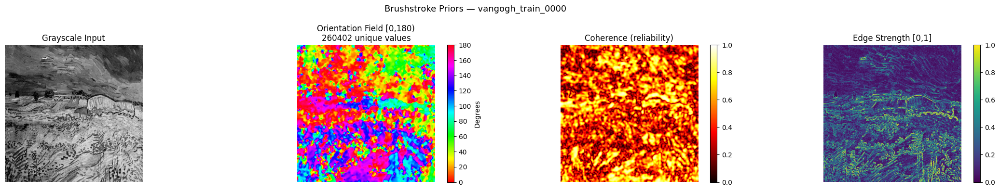

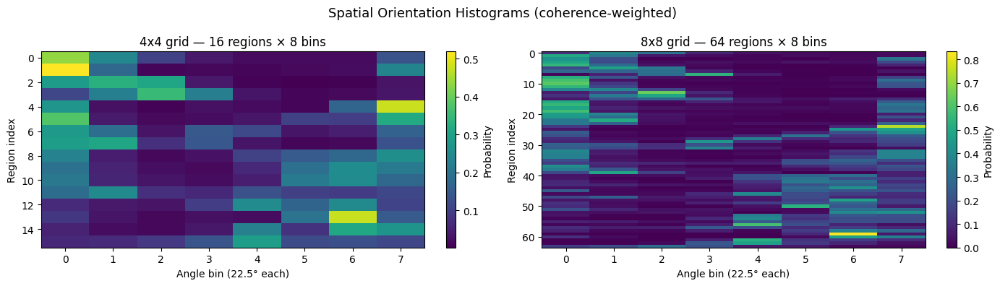

BRUSHSTROKE PRIOR EXTRACTION → HDF5
  Output      : /Users/althafali/Downloads/ARTIFEX/implementation/brushstroke_features.h5
  fast_dev_run: False
  sigma       : 3.0
  flow_offset : 90.0°
  hist coh th : 0.05

  train: 1417 images


  train: 100%|██████████| 1417/1417 [02:33<00:00,  9.22it/s]


  val: 303 images


  val: 100%|██████████| 303/303 [00:33<00:00,  9.13it/s]


  test: 305 images


  test: 100%|██████████| 305/305 [00:32<00:00,  9.32it/s]



H5 saved → /Users/althafali/Downloads/ARTIFEX/implementation/brushstroke_features.h5  (2617.1 MB)
H5 VERIFICATION
Splits: ['test', 'train', 'val']

  TRAIN:
    Disk images : 1417
    H5 images   : 1417
    Alignment: PERFECT MATCH
    orientation_field: range=[0.0000, 179.8750] (no 180 OK)
    coherence_map:     range=[0.0014, 0.9790] OK
    edge_strength_map: range=[0.0000, 1.0000] OK
    histograms: row sums OK

  VAL:
    Disk images : 303
    H5 images   : 303
    Alignment: PERFECT MATCH
    orientation_field: range=[0.0000, 179.8750] (no 180 OK)
    coherence_map:     range=[0.0004, 0.9946] OK
    edge_strength_map: range=[0.0000, 1.0000] OK
    histograms: row sums OK

  TEST:
    Disk images : 305
    H5 images   : 305
    Alignment: PERFECT MATCH
    orientation_field: range=[0.0000, 179.8750] (no 180 OK)
    coherence_map:     range=[0.0011, 0.9917] OK
    edge_strength_map: range=[0.0000, 1.0000] OK
    histograms: row sums OK

  File size: 2617.1 MB
H5 verification: ALL C

In [123]:


PROC_DIR     = str("/Users/althafali/Downloads/ARTIFEX/implementation/data/processed")   # from your env cell
H5_PATH      = str("/Users/althafali/Downloads/ARTIFEX/implementation/brushstroke_features.h5")
FAST_DEV_RUN = False

# Step 1: Sanity check on one image before committing to full run
run_sanity_checks(PROC_DIR)
# Step 2: Build the full H5
build_brushstroke_h5(PROC_DIR, H5_PATH, fast_dev_run=FAST_DEV_RUN)

# Step 3: Verify everything written correctly
verify_h5(H5_PATH, PROC_DIR)

SANITY CHECK — vangogh_train_0000.png
  orientation_field  : range=[0.0004, 179.9995], unique_values=260402  OK
  coherence_map      : range=[0.0014, 0.9792]  OK
  edge_strength_map  : range=[0.0000, 1.0000]  OK
  spatial_hist_4x4   : shape=(16, 8), row sums OK
  spatial_hist_8x8   : shape=(64, 8), row sums OK
All sanity checks PASSED



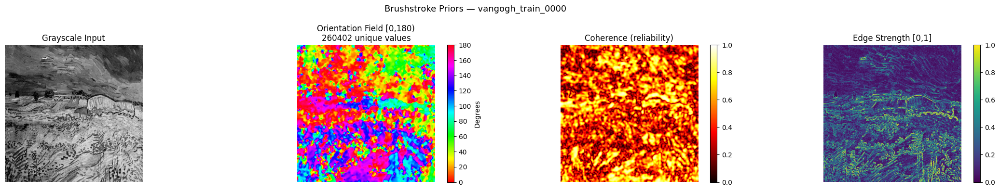

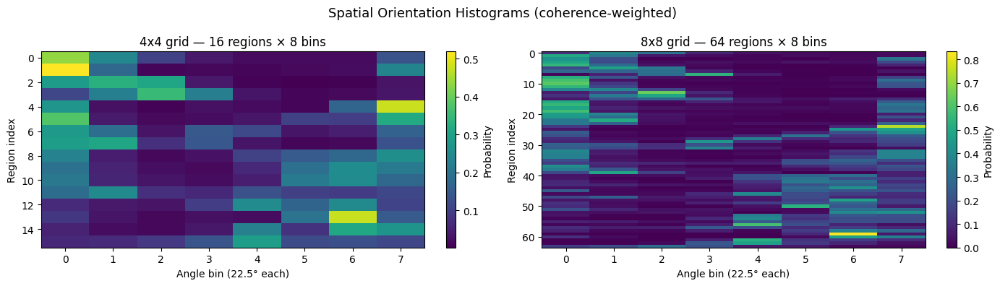

In [ ]:
run_sanity_checks(PROC_DIR)

In [125]:
import random
import cv2
import json

def create_damaged_images(split):
    # Paths
    original_dir = os.path.join(processed_path, f"{split}/original")
    masked_dir = os.path.join(processed_path, f"{split}/masked")
    augmented_mask_dir = os.path.join(processed_path, f"{split}/augmented_masks")  # Crack masks (low coverage)
    holes_mask_dir = os.path.join(processed_path, f"{split}/augmented_holes")      # FIX: Holes masks (high coverage)
    mask_save_dir = os.path.join(processed_path, f"{split}/masks")
    metadata_path = os.path.join(processed_path, f"{split}/metadata.json")

    os.makedirs(masked_dir, exist_ok=True)
    os.makedirs(mask_save_dir, exist_ok=True)

    # Get files
    image_files = sorted([f for f in os.listdir(original_dir) if f.endswith('.png')])
    
    # FIX: Load crack masks (low coverage: 5%, 10%, 15%)
    crack_mask_files = [f for f in os.listdir(augmented_mask_dir) if f.endswith('.png')]
    crack_masks_05 = [f for f in crack_mask_files if '_cov5' in f]
    crack_masks_10 = [f for f in crack_mask_files if '_cov10' in f]
    crack_masks_15 = [f for f in crack_mask_files if '_cov15' in f]
    
    # FIX: Load holes masks (high coverage: 30%, 45%)
    holes_mask_files = []
    if os.path.exists(holes_mask_dir):
        holes_mask_files = [f for f in os.listdir(holes_mask_dir) if f.endswith('.png')]
    holes_masks_30 = [f for f in holes_mask_files if '_cov30' in f]
    holes_masks_45 = [f for f in holes_mask_files if '_cov45' in f]

    print(f"Crack masks: 5%={len(crack_masks_05)}, 10%={len(crack_masks_10)}, 15%={len(crack_masks_15)}")
    print(f"Holes masks: 30%={len(holes_masks_30)}, 45%={len(holes_masks_45)}")

    # Split-specific random seed
    split_seeds = {'train': 42, 'val': 123, 'test': 456}
    random.seed(split_seeds[split])
    np.random.seed(split_seeds[split])

    # Pre-load all masks into memory
    print(f"Pre-loading crack masks...")
    crack_cache = {}
    for mask_file in tqdm(crack_mask_files, desc="Loading crack masks"):
        mask_path = os.path.join(augmented_mask_dir, mask_file)
        crack_cache[mask_file] = load_mask(mask_path)
    
    print(f"Pre-loading holes masks...")
    holes_cache = {}
    for mask_file in tqdm(holes_mask_files, desc="Loading holes masks"):
        mask_path = os.path.join(holes_mask_dir, mask_file)
        holes_cache[mask_file] = load_mask(mask_path)

    metadata = []
    corruption_stats = {'remove': 0}

    for img_file in tqdm(image_files, desc=f"Creating damaged images for {split}"):
        # Load original image
        img_path = os.path.join(original_dir, img_file)
        original = Image.open(img_path).convert('RGB')
        original_np = np.array(original) / 255.0

        # FIX: Select mask type based on desired coverage distribution
        # Mix of crack masks (low coverage) and holes masks (high coverage)
        if split == 'train':
            # Training: balanced mix of all coverage levels
            coverage_choice = random.choice(['5', '10', '15', '30', '45'])
        else:
            # Val/Test: stratified sampling
            coverage_choice = random.choice(['5', '10', '15', '30', '45'])
        
        # FIX: Use appropriate mask type based on coverage
        if coverage_choice in ['5', '10', '15']:
            # Use crack masks for low coverage
            if coverage_choice == '5' and crack_masks_05:
                mask_file = random.choice(crack_masks_05)
            elif coverage_choice == '10' and crack_masks_10:
                mask_file = random.choice(crack_masks_10)
            else:
                mask_file = random.choice(crack_masks_15) if crack_masks_15 else random.choice(crack_mask_files)
            mask = crack_cache[mask_file]
            mask_type = 'crack'
        else:
            # Use holes masks for high coverage
            if coverage_choice == '30' and holes_masks_30:
                mask_file = random.choice(holes_masks_30)
                mask = holes_cache[mask_file]
                mask_type = 'holes'
            elif coverage_choice == '45' and holes_masks_45:
                mask_file = random.choice(holes_masks_45)
                mask = holes_cache[mask_file]
                mask_type = 'holes'
            else:
                # Fallback to crack masks if holes not available
                mask_file = random.choice(crack_mask_files)
                mask = crack_cache[mask_file]
                mask_type = 'crack'

        # Apply spatial randomization with smaller range
        dx = random.randint(-50, 50)
        dy = random.randint(-50, 50)

        h, w = mask.shape
        M = np.float32([[1, 0, dx], [0, 1, dy]])
        shifted_mask = cv2.warpAffine(mask, M, (w, h), flags=cv2.INTER_NEAREST,
                                      borderMode=cv2.BORDER_CONSTANT, borderValue=0)

        # Create corrupted image - use simple removal
        corrupted = original_np.copy()
        mask_bool = shifted_mask > 0

        # Standard inpainting corruption: set to black
        corrupted[mask_bool] = 0
        corruption_type = 'remove'
        corruption_stats[corruption_type] += 1

        # Verification
        actual_damaged = np.sum(mask_bool)
        expected_damaged = np.sum(mask > 0)

        # Save corrupted image
        corrupted_img = Image.fromarray((corrupted * 255).astype(np.uint8))
        corrupted_path = os.path.join(masked_dir, img_file)
        corrupted_img.save(corrupted_path)

        # Save the shifted mask
        mask_save_path = os.path.join(mask_save_dir, img_file)
        save_mask(shifted_mask, mask_save_path)

        # Track metadata
        actual_coverage = (np.sum(shifted_mask > 0) / (512 * 512)) * 100
        metadata.append({
            'image_name': img_file,
            'mask_used': mask_file,
            'mask_type': mask_type,  # FIX: Track whether crack or holes
            'coverage_percent': round(actual_coverage, 2),
            'corruption_type': corruption_type,
            'dx': dx,
            'dy': dy,
            'actual_damaged_pixels': int(actual_damaged),
            'expected_damaged_pixels': int(expected_damaged)
        })

    # Save metadata
    with open(metadata_path, 'w') as f:
        json.dump(metadata, f, indent=2)

    print(f"\n{split} split complete:")
    print(f"  - Created {len(image_files)} damaged images")
    print(f"  - Corruption methods: {corruption_stats}")
    print(f"  - Metadata saved to {metadata_path}")

# Create damaged images for all splits
for split in ['train', 'val', 'test']:
    create_damaged_images(split)

print("\n✓ All damaged training images created. Quadruplets available:")
print("  - Corrupted image (in masked/ folder)")
print("  - Mask (in masks/ folder)")
print("  - Original undamaged image (in original/ folder)")
print("  - Brushstroke measurements (in brushstroke_features.h5)")
print("  - Metadata (in metadata.json)")

Crack masks: 5%=0, 10%=0, 15%=306
Holes masks: 30%=0, 45%=0
Pre-loading crack masks...


Loading crack masks: 100%|██████████| 918/918 [00:00<00:00, 982.52it/s] 


Pre-loading holes masks...


Loading holes masks: 0it [00:00, ?it/s]
Creating damaged images for train: 100%|██████████| 1417/1417 [00:34<00:00, 40.67it/s]



train split complete:
  - Created 1417 damaged images
  - Corruption methods: {'remove': 1417}
  - Metadata saved to /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/train/metadata.json
Crack masks: 5%=0, 10%=0, 15%=63
Holes masks: 30%=0, 45%=0
Pre-loading crack masks...


Loading crack masks: 100%|██████████| 189/189 [00:00<00:00, 610.46it/s]


Pre-loading holes masks...


Loading holes masks: 0it [00:00, ?it/s]
Creating damaged images for val: 100%|██████████| 303/303 [00:07<00:00, 38.11it/s]



val split complete:
  - Created 303 damaged images
  - Corruption methods: {'remove': 303}
  - Metadata saved to /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/val/metadata.json
Crack masks: 5%=0, 10%=0, 15%=72
Holes masks: 30%=0, 45%=0
Pre-loading crack masks...


Loading crack masks: 100%|██████████| 216/216 [00:00<00:00, 898.84it/s]


Pre-loading holes masks...


Loading holes masks: 0it [00:00, ?it/s]
Creating damaged images for test: 100%|██████████| 305/305 [00:08<00:00, 37.57it/s]


test split complete:
  - Created 305 damaged images
  - Corruption methods: {'remove': 305}
  - Metadata saved to /Users/althafali/Downloads/ARTIFEX/implementation/data/processed/test/metadata.json

✓ All damaged training images created. Quadruplets available:
  - Corrupted image (in masked/ folder)
  - Mask (in masks/ folder)
  - Original undamaged image (in original/ folder)
  - Brushstroke measurements (in brushstroke_features.h5)
  - Metadata (in metadata.json)


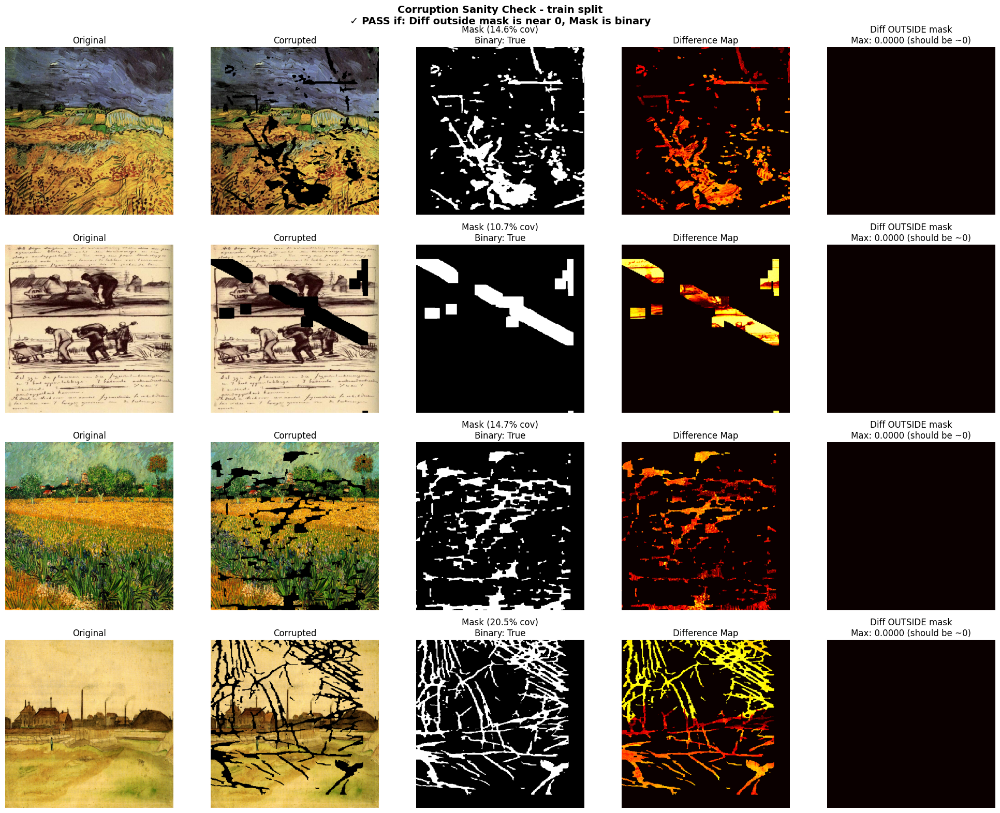


CORRUPTION SANITY CHECK RESULTS


In [126]:
# ============================================================================
# PHASE 1.6: SANITY VISUALIZATION - VERIFY CORRUPTION PIPELINE
# ============================================================================

def visualize_corruption_samples(split='train', num_samples=4):
    """
    Visualize corruption samples to verify:
    - Mask matches removed pixels exactly (no offset mismatch)
    - Original undamaged areas are preserved
    - Mask is binary
    """
    original_dir = os.path.join(processed_path, f"{split}/original")
    masked_dir = os.path.join(processed_path, f"{split}/masked")
    mask_dir = os.path.join(processed_path, f"{split}/masks")
    
    image_files = sorted([f for f in os.listdir(masked_dir) if f.endswith('.png')])[:num_samples]
    
    fig, axes = plt.subplots(num_samples, 5, figsize=(20, num_samples * 4))
    
    for i, fname in enumerate(image_files):
        # Load all components
        original = np.array(Image.open(os.path.join(original_dir, fname)).convert('RGB')) / 255.0
        corrupted = np.array(Image.open(os.path.join(masked_dir, fname)).convert('RGB')) / 255.0
        mask = np.array(Image.open(os.path.join(mask_dir, fname)).convert('L')) / 255.0
        
        # Compute difference (should be zero outside mask)
        diff = np.abs(original - corrupted).mean(axis=2)
        diff_outside_mask = diff * (1 - mask)
        
        # Verify mask is binary
        unique_vals = np.unique(mask)
        is_binary = len(unique_vals) <= 2 and all(v in [0, 1] for v in unique_vals)
        
        # Plot
        axes[i, 0].imshow(original)
        axes[i, 0].set_title(f'Original')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(corrupted)
        axes[i, 1].set_title(f'Corrupted')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(mask, cmap='gray')
        mask_cov = mask.mean() * 100
        axes[i, 2].set_title(f'Mask ({mask_cov:.1f}% cov)\nBinary: {is_binary}')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(diff, cmap='hot', vmin=0, vmax=1)
        axes[i, 3].set_title(f'Difference Map')
        axes[i, 3].axis('off')
        
        axes[i, 4].imshow(diff_outside_mask, cmap='hot', vmin=0, vmax=0.1)
        max_outside = diff_outside_mask.max()
        axes[i, 4].set_title(f'Diff OUTSIDE mask\nMax: {max_outside:.4f} (should be ~0)')
        axes[i, 4].axis('off')
    
    plt.suptitle(f'Corruption Sanity Check - {split} split\n'
                 f'✓ PASS if: Diff outside mask is near 0, Mask is binary', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*60)
    print("CORRUPTION SANITY CHECK RESULTS")
    print("="*60)

# Run sanity check
visualize_corruption_samples('train', num_samples=4)

In [128]:
import json

# Check validation coverage distribution
with open(os.path.join(processed_path, 'val/metadata.json'), 'r') as f:
    val_metadata = json.load(f)

coverage_counts = {'15': 0, '30': 0, '45': 0}
for entry in val_metadata:
    cov = entry['coverage_percent']
    if 13 <= cov <= 17:
        coverage_counts['15'] += 1
    elif 28 <= cov <= 32:
        coverage_counts['30'] += 1
    elif 43 <= cov <= 47:
        coverage_counts['45'] += 1

print("Validation Coverage Distribution:")
for level, count in coverage_counts.items():
    print(f"  {level}% coverage: {count} images ({count/len(val_metadata)*100:.1f}%)")

# Check test coverage distribution
with open(os.path.join(processed_path, 'test/metadata.json'), 'r') as f:
    test_metadata = json.load(f)

coverage_counts = {'15': 0, '30': 0, '45': 0}
for entry in test_metadata:
    cov = entry['coverage_percent']
    if 13 <= cov <= 17:
        coverage_counts['15'] += 1
    elif 28 <= cov <= 32:
        coverage_counts['30'] += 1
    elif 43 <= cov <= 47:
        coverage_counts['45'] += 1

print("\nTest Coverage Distribution:")
for level, count in coverage_counts.items():
    print(f"  {level}% coverage: {count} images ({count/len(test_metadata)*100:.1f}%)")

Validation Coverage Distribution:
  15% coverage: 91 images (30.0%)
  30% coverage: 16 images (5.3%)
  45% coverage: 2 images (0.7%)

Test Coverage Distribution:
  15% coverage: 195 images (63.9%)
  30% coverage: 11 images (3.6%)
  45% coverage: 10 images (3.3%)


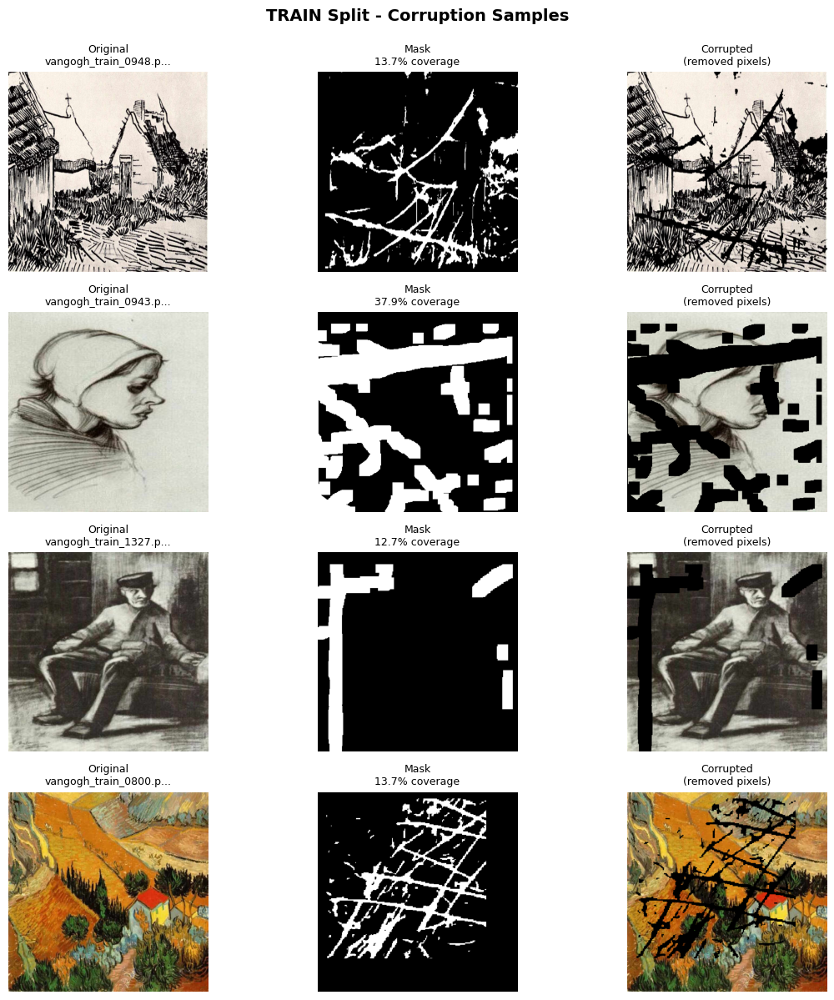

Saved visualization to train_corruption_samples.png


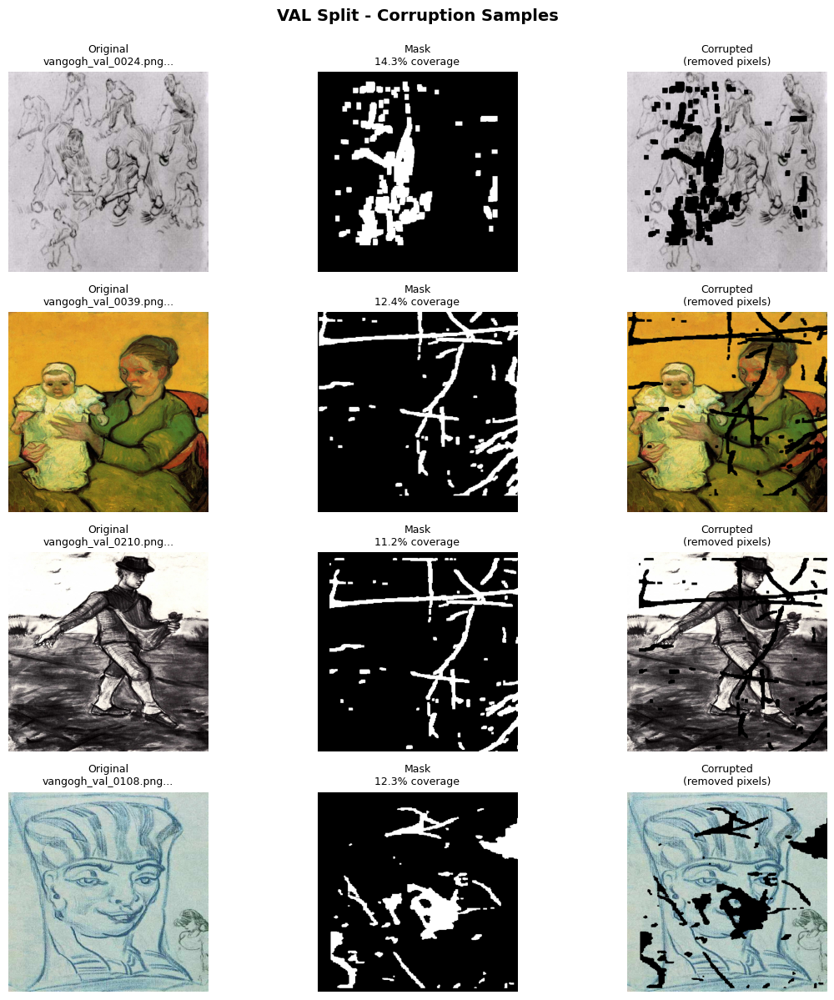

Saved visualization to val_corruption_samples.png


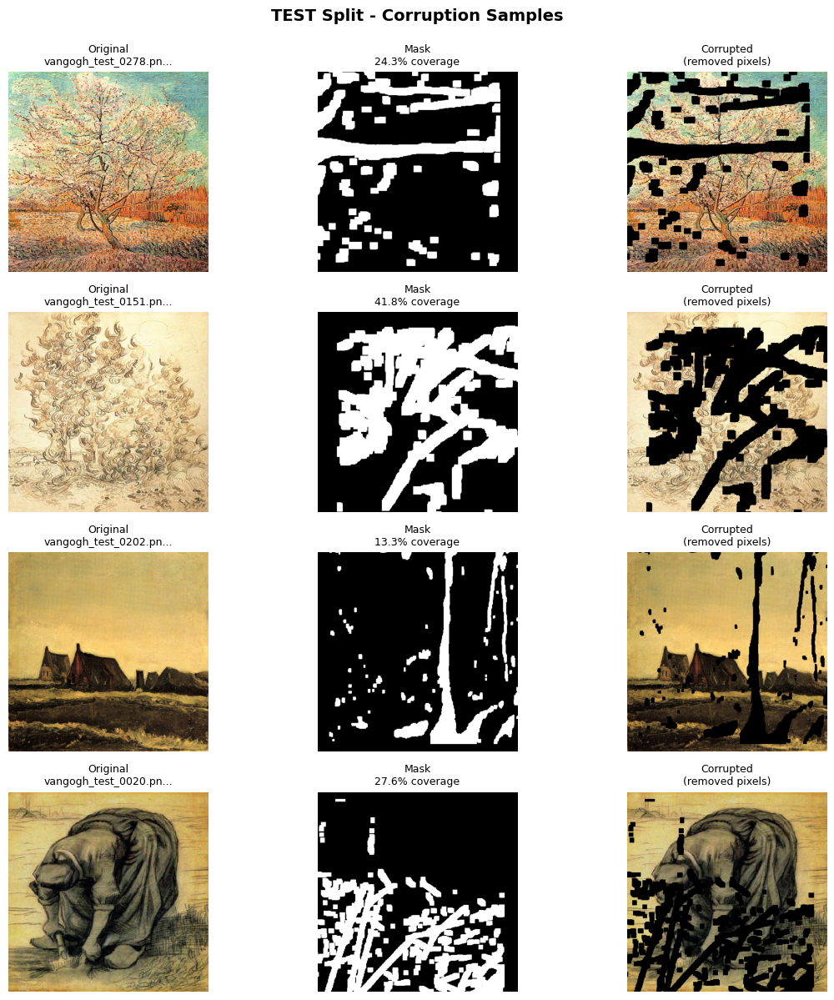

Saved visualization to test_corruption_samples.png


In [129]:
import matplotlib.pyplot as plt
import random
from PIL import Image
import numpy as np

def visualize_corruption_samples(split='train', num_samples=6):
    """Visualize original, mask, and corrupted images side-by-side"""

    original_dir = os.path.join(processed_path, f"{split}/original")
    masked_dir = os.path.join(processed_path, f"{split}/masked")
    mask_dir = os.path.join(processed_path, f"{split}/masks")

    # Get random samples
    all_files = [f for f in os.listdir(original_dir) if f.endswith('.png')]
    sample_files = random.sample(all_files, min(num_samples, len(all_files)))

    # Load metadata
    with open(os.path.join(processed_path, f"{split}/metadata.json"), 'r') as f:
        metadata = json.load(f)
    metadata_dict = {m['image_name']: m for m in metadata}

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples*3))

    for i, fname in enumerate(sample_files):
        # Load images
        orig = np.array(Image.open(os.path.join(original_dir, fname))) / 255.0
        corr = np.array(Image.open(os.path.join(masked_dir, fname))) / 255.0
        mask = load_mask(os.path.join(mask_dir, fname)) / 255.0

        # Get metadata
        meta = metadata_dict.get(fname, {})
        coverage = meta.get('coverage_percent', 0)

        # Plot
        axes[i, 0].imshow(orig)
        axes[i, 0].set_title(f'Original\n{fname[:20]}...', fontsize=9)
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title(f'Mask\n{coverage:.1f}% coverage', fontsize=9)
        axes[i, 1].axis('off')

        axes[i, 2].imshow(corr)
        axes[i, 2].set_title(f'Corrupted\n(removed pixels)', fontsize=9)
        axes[i, 2].axis('off')

    plt.suptitle(f'{split.upper()} Split - Corruption Samples',
                 fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(f'{split}_corruption_samples.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"Saved visualization to {split}_corruption_samples.png")

# Visualize samples from each split
for split in ['train', 'val', 'test']:
    visualize_corruption_samples(split, num_samples=4)

In [134]:
import os
import h5py
import numpy as np

def verify_brushstroke_features(H5_PATH, processed_path):
    """
    Verify brushstroke HDF5 structure and filename alignment with dataset images.

    Checks:
    - train/val/test splits exist
    - all corrupted images have corresponding brushstroke features
    - all required keys exist per image
    - shapes and ranges look valid
    """
    required_keys = {
        "orientation_field",
        "coherence_map",
        "edge_strength_map",
        "spatial_hist_4x4",
        "spatial_hist_8x8",
    }

    print("=== Brushstroke Features HDF5 Verification ===\n")

    with h5py.File(H5_PATH, "r") as f:
        h5_splits = set(f.keys())
        expected_splits = {"train", "val", "test"}

        missing_splits = expected_splits - h5_splits
        if missing_splits:
            print(f"Missing splits in H5: {missing_splits}\n")

        for split in ["train", "val", "test"]:
            if split not in f:
                print(f"{split.upper()} Split: MISSING in H5\n")
                continue

            split_group = f[split]
            image_names = sorted(list(split_group.keys()))

            print(f"{split.upper()} Split:")
            print(f"  Total images with features: {len(image_names)}")

            if len(image_names) == 0:
                print("  ✗ No images in this split\n")
                continue

            # Inspect first image
            first_img = image_names[0]
            img_group = split_group[first_img]
            present_keys = set(img_group.keys())

            missing_keys = required_keys - present_keys
            extra_keys = present_keys - required_keys

            if missing_keys:
                print(f"  ✗ Missing keys in first sample ({first_img}): {missing_keys}")
            else:
                print(f"  ✓ Required keys present in first sample ({first_img})")

            if extra_keys:
                print(f"  (Info) Extra keys in first sample: {extra_keys}")

            # Shapes
            o = img_group["orientation_field"][:]
            c = img_group["coherence_map"][:]
            e = img_group["edge_strength_map"][:]
            h4 = img_group["spatial_hist_4x4"][:]
            h8 = img_group["spatial_hist_8x8"][:]

            print(f"  orientation_field shape: {o.shape} | dtype={o.dtype}")
            print(f"  coherence_map     shape: {c.shape} | dtype={c.dtype}")
            print(f"  edge_strength_map shape: {e.shape} | dtype={e.dtype}")
            print(f"  spatial_hist_4x4  shape: {h4.shape} | dtype={h4.dtype}")
            print(f"  spatial_hist_8x8  shape: {h8.shape} | dtype={h8.dtype}")

            # Basic range checks (first sample)
            o32 = o.astype(np.float32)
            c32 = c.astype(np.float32)
            e32 = e.astype(np.float32)

            print(f"  orientation range: [{o32.min():.4f}, {o32.max():.4f}] (should be [0,180))")
            print(f"  coherence range  : [{c32.min():.4f}, {c32.max():.4f}] (should be [0,1])")
            print(f"  edge range       : [{e32.min():.4f}, {e32.max():.4f}] (should be [0,1])")

            # Histogram normalization checks (first sample)
            h4_ok = np.allclose(h4.sum(axis=1), 1.0, atol=1e-4)
            h8_ok = np.allclose(h8.sum(axis=1), 1.0, atol=1e-4)
            print(f"  h4 row sums ~1.0 : {h4_ok}")
            print(f"  h8 row sums ~1.0 : {h8_ok}")

            # Filename alignment checks against dataset folders
            original_dir  = os.path.join(processed_path, f"{split}/original")
            corrupted_dir = os.path.join(processed_path, f"{split}/masked")
            mask_dir      = os.path.join(processed_path, f"{split}/masks")

            original_files  = set([f for f in os.listdir(original_dir) if f.endswith('.png')]) if os.path.exists(original_dir) else set()
            corrupted_files = set([f for f in os.listdir(corrupted_dir) if f.endswith('.png')]) if os.path.exists(corrupted_dir) else set()
            mask_files      = set([f for f in os.listdir(mask_dir) if f.endswith('.png')]) if os.path.exists(mask_dir) else set()
            feature_files   = set(image_names)

            print(f"  Files on disk: original={len(original_files)}, masked={len(corrupted_files)}, masks={len(mask_files)}")

            # Brushstroke features were extracted from originals, but names should match corrupted/masks too
            if feature_files == corrupted_files:
                print("  ✓ All corrupted images have brushstroke features")
            else:
                missing = sorted(list(corrupted_files - feature_files))[:5]
                extra = sorted(list(feature_files - corrupted_files))[:5]
                print(f"  ✗ Mismatch with corrupted images")
                print(f"    Missing features count: {len(corrupted_files - feature_files)}")
                print(f"    Extra features count  : {len(feature_files - corrupted_files)}")
                if missing:
                    print(f"    Example missing: {missing}")
                if extra:
                    print(f"    Example extra  : {extra}")

            if original_files == corrupted_files == mask_files:
                print("  ✓ original / masked / masks filenames are aligned")
            else:
                print("  ✗ original / masked / masks filename mismatch")

            print()

# Usage
verify_brushstroke_features(H5_PATH, processed_path)

=== Brushstroke Features HDF5 Verification ===

TRAIN Split:
  Total images with features: 1417
  ✓ Required keys present in first sample (vangogh_train_0000.png)
  orientation_field shape: (512, 512, 1) | dtype=float16
  coherence_map     shape: (512, 512, 1) | dtype=float16
  edge_strength_map shape: (512, 512, 1) | dtype=float16
  spatial_hist_4x4  shape: (16, 8) | dtype=float32
  spatial_hist_8x8  shape: (64, 8) | dtype=float32
  orientation range: [0.0000, 179.8750] (should be [0,180))
  coherence range  : [0.0014, 0.9790] (should be [0,1])
  edge range       : [0.0000, 1.0000] (should be [0,1])
  h4 row sums ~1.0 : True
  h8 row sums ~1.0 : True
  Files on disk: original=1417, masked=1417, masks=1417
  ✓ All corrupted images have brushstroke features
  ✓ original / masked / masks filenames are aligned

VAL Split:
  Total images with features: 303
  ✓ Required keys present in first sample (vangogh_val_0000.png)
  orientation_field shape: (512, 512, 1) | dtype=float16
  coherence_m

In [133]:
import os

def check_data_sizes():
    """Verify all data is properly created"""

    splits = ['train', 'val', 'test']

    print("=== Data Pipeline Summary ===\n")

    for split in splits:
        base_path = os.path.join(processed_path, split)

        original_count = len([f for f in os.listdir(f"{base_path}/original") if f.endswith('.png')])
        masked_count = len([f for f in os.listdir(f"{base_path}/masked") if f.endswith('.png')])
        mask_count = len([f for f in os.listdir(f"{base_path}/masks") if f.endswith('.png')])
        augmented_mask_count = len([f for f in os.listdir(f"{base_path}/augmented_masks") if f.endswith('.png')])

        print(f"{split.upper()} Split:")
        print(f"  Original images: {original_count}")
        print(f"  Corrupted images: {masked_count}")
        print(f"  Applied masks: {mask_count}")
        print(f"  Available augmented masks: {augmented_mask_count}")

        # Check if all match
        if original_count == masked_count == mask_count:
            print(f"  ✓ All quadruplet components present")
        else:
            print(f"  ✗ Mismatch detected!")
        print()

    print("Quadruplet structure verified:")
    print("  1. Original image (original/*.png)")
    print("  2. Corrupted image (masked/*.png)")
    print("  3. Applied mask (masks/*.png)")
    print("  4. Brushstroke features (brushstroke_features.h5)")
    print("  5. Metadata (metadata.json)")

check_data_sizes()

=== Data Pipeline Summary ===

TRAIN Split:
  Original images: 1417
  Corrupted images: 1417
  Applied masks: 1417
  Available augmented masks: 918
  ✓ All quadruplet components present

VAL Split:
  Original images: 303
  Corrupted images: 303
  Applied masks: 303
  Available augmented masks: 189
  ✓ All quadruplet components present

TEST Split:
  Original images: 305
  Corrupted images: 305
  Applied masks: 305
  Available augmented masks: 216
  ✓ All quadruplet components present

Quadruplet structure verified:
  1. Original image (original/*.png)
  2. Corrupted image (masked/*.png)
  3. Applied mask (masks/*.png)
  4. Brushstroke features (brushstroke_features.h5)
  5. Metadata (metadata.json)


In [132]:
import os
import shutil

# Paths
# processed_path already defined in Cell 1

for split in ['train', 'val', 'test']:
    masks_dir = os.path.join(processed_path, f"{split}/masks")
    masked_dir = os.path.join(processed_path, f"{split}/masked")

    # Get valid image names (without extension)
    valid_images = set([os.path.splitext(f)[0] for f in os.listdir(masked_dir) if f.endswith('.png')])

    # Remove masks that don't have corresponding corrupted images
    for mask_file in os.listdir(masks_dir):
        if mask_file.endswith('.png'):
            mask_name = os.path.splitext(mask_file)[0]
            if mask_name not in valid_images:
                os.remove(os.path.join(masks_dir, mask_file))
                print(f"Removed orphan mask: {mask_file}")

    print(f"{split}: Cleaned up masks folder")



Removed orphan mask: 016.png
Removed orphan mask: 015.png
Removed orphan mask: 014.png
Removed orphan mask: 01312.png
Removed orphan mask: 01338.png
Removed orphan mask: 01310.png
Removed orphan mask: 01311.png
Removed orphan mask: 01339.png
Removed orphan mask: 01314.png
Removed orphan mask: 01317.png
Removed orphan mask: 01332.png
Removed orphan mask: 01326.png
Removed orphan mask: 01327.png
Removed orphan mask: 01333.png
Removed orphan mask: 01319.png
Removed orphan mask: 01325.png
Removed orphan mask: 01331.png
Removed orphan mask: 01330.png
Removed orphan mask: 01318.png
Removed orphan mask: 01320.png
Removed orphan mask: 01334.png
Removed orphan mask: 01335.png
Removed orphan mask: 01321.png
Removed orphan mask: 01337.png
Removed orphan mask: 01322.png
Removed orphan mask: 01336.png
Removed orphan mask: 0131.png
Removed orphan mask: 01343.png
Removed orphan mask: 0136.png
Removed orphan mask: 0137.png
Removed orphan mask: 01342.png
Removed orphan mask: 01340.png
Removed orphan ma